In [ ]:
!pip3 install numpy | grep -v 'already satisfied'
!pip3 install pandas | grep -v 'already satisfied'
!pip3 install seaborn | grep -v 'already satisfied'
!pip3 install scanpy | grep -v 'already satisfied'

In [140]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.2 anndata==0.8.0 umap==0.5.3 numpy==1.22.0 scipy==1.10.0 pandas==1.5.3 scikit-learn==1.2.1 statsmodels==0.13.5 python-igraph==0.10.4 louvain==0.8.0 pynndescent==0.5.8


In [141]:
!ls

1914                            figures
1914-gene-sets-44FQWR6J-backups genes.csv
1914-gene-sets-44FQWR6J.csv     main.ipynb
1914-gene-sets-NQ6TBIKD-backups manifest.tsv
1914-gene-sets-NQ6TBIKD.csv     models
1914d                           my_dict.csv
1919                            names.csv
1919d                           ref
README.md                       samplesheet.tsv
SF1                             scores.csv
SF10127                         second.ipynb
SF6                             write
cache


In [146]:
import os

# path for local storage
path = "/Volumes/Extreme_SSD/snRNA/"

# pathfor remote storage:
# path = "data/"

# for each folder in path make an adata object with a unique name with read_10x_mtx
folders = os.listdir(path)

data=[]
for folder in folders:
    adata = sc.read_10x_mtx(path+folder, var_names='gene_symbols', cache=True, prefix=folder+'_')
    data.append([folder,
                  adata])

... reading from cache file cache/Volumes-Extreme_SSD-snRNA-GSM4119522_SF10127-GSM4119522_SF10127_matrix.h5ad
... reading from cache file cache/Volumes-Extreme_SSD-snRNA-GSM4119523_SF11979sn-GSM4119523_SF11979sn_matrix.h5ad
... reading from cache file cache/Volumes-Extreme_SSD-snRNA-GSM4119524_SF12090-GSM4119524_SF12090_matrix.h5ad
... reading from cache file cache/Volumes-Extreme_SSD-snRNA-GSM4119525_SF12264-GSM4119525_SF12264_matrix.h5ad
... reading from cache file cache/Volumes-Extreme_SSD-snRNA-GSM4119526_SF4400-GSM4119526_SF4400_matrix.h5ad
... reading from cache file cache/Volumes-Extreme_SSD-snRNA-GSM4119527_SF4297-GSM4119527_SF4297_matrix.h5ad
... reading from cache file cache/Volumes-Extreme_SSD-snRNA-GSM4119528_SF6996-GSM4119528_SF6996_matrix.h5ad
... reading from cache file cache/Volumes-Extreme_SSD-snRNA-GSM4119529_SF9259R-GSM4119529_SF9259R_matrix.h5ad
... reading from cache file cache/Volumes-Extreme_SSD-snRNA-GSM4119530_SF9259S-GSM4119530_SF9259S_matrix.h5ad
... reading 

In [147]:
# adata_us_combined = sc.read_h5ad('write/human_combined_2.h5ad')
adata_total_combined = sc.read_h5ad('write/total_combined.h5ad')


In [148]:
adata_total_combined.obs

,batch
AAACCCAAGACATCCT-1-1914_human-1914,1914
AAACCCAAGCATGAAT-1-1914_human-1914,1914
AAACCCAAGCTAGATA-1-1914_human-1914,1914
AAACCCAAGTCCTGCG-1-1914_human-1914,1914
AAACCCACAAAGGAGA-1-1914_human-1914,1914
...,...
TTTGTTGCATCCTTGC-1-1919d_rat-1919,1919
TTTGTTGGTGTAGTGG-1-1919d_rat-1919,1919
TTTGTTGTCCATACTT-1-1919d_rat-1919,1919
TTTGTTGTCCCAAGCG-1-1919d_rat-1919,1919


In [149]:
sc.pp.neighbors(adata_total_combined, n_neighbors=10, n_pcs=40)


computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:56)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:59)


In [150]:
sc.tl.louvain(adata_total_combined, resolution=0.5)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 60 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:09)


In [151]:
adata_total_combined.obs['sample_type'] = adata_total_combined.obs.index.str.split('-1-').str[1]
adata_total_combined.obs


,batch,louvain,sample_type
AAACCCAAGACATCCT-1-1914_human-1914,1914,0,1914_human-1914
AAACCCAAGCATGAAT-1-1914_human-1914,1914,0,1914_human-1914
AAACCCAAGCTAGATA-1-1914_human-1914,1914,0,1914_human-1914
AAACCCAAGTCCTGCG-1-1914_human-1914,1914,0,1914_human-1914
AAACCCACAAAGGAGA-1-1914_human-1914,1914,7,1914_human-1914
...,...,...,...
TTTGTTGCATCCTTGC-1-1919d_rat-1919,1919,35,1919d_rat-1919
TTTGTTGGTGTAGTGG-1-1919d_rat-1919,1919,16,1919d_rat-1919
TTTGTTGTCCATACTT-1-1919d_rat-1919,1919,18,1919d_rat-1919
TTTGTTGTCCCAAGCG-1-1919d_rat-1919,1919,24,1919d_rat-1919


In [152]:
# how many leiden clusters are there?
adata_total_combined.obs['louvain'].value_counts()

0     8342
1     7653
2     5132
3     3107
4     3093
5     2805
6     2267
7     2186
8     2026
9     1465
10    1343
11    1223
12    1208
13    1161
14    1125
15    1100
16    1025
17     996
18     982
19     888
20     807
21     752
22     698
23     682
24     661
25     620
26     608
27     604
28     596
29     589
30     586
31     580
32     543
33     537
34     530
35     519
36     507
37     491
38     489
39     486
40     470
41     468
42     446
43     440
44     435
45     423
46     420
47     321
48     305
49     281
50     269
51     238
52     217
53     217
54     155
55     153
56     112
57     108
58      83
59      79
Name: louvain, dtype: int64

In [153]:
sc.tl.umap(adata_total_combined, min_dist=0.3)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:03:22)


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


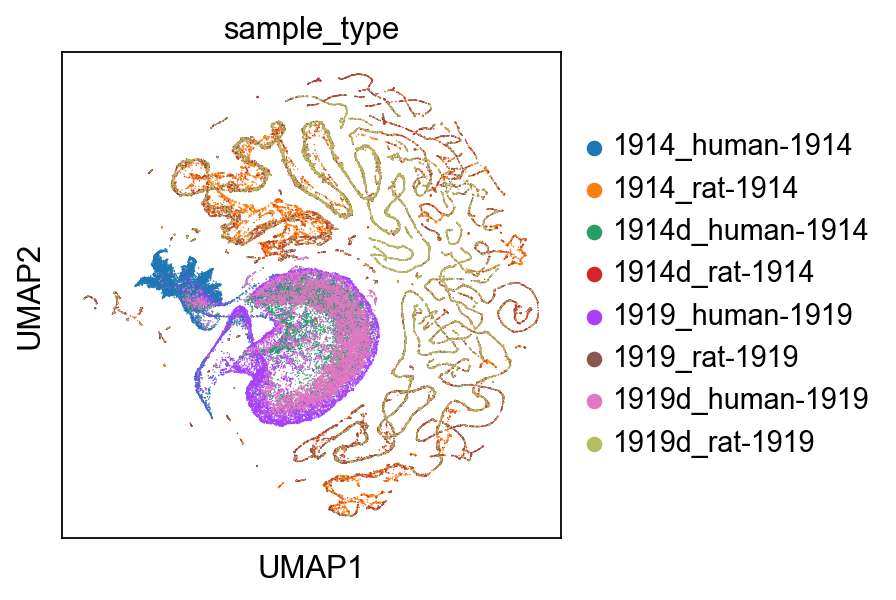

In [154]:
sc.pl.umap(adata_total_combined, color=['sample_type'])

In [155]:
# annotate with provide cell types from .txt file
cell_types = pd.read_csv('SF1/GSE138794_snRNA_Seq_cell_types.txt', sep=' ', header=None, index_col=0)

In [156]:
sample_identifiers = [
    "SF10022",
    "SF10127",
    "SF11979",
    "SF12090",
    "SF12264",
    "SF4400",
    "SF4297",
    "SF6996",
    "SF9259R",
    "SF9259S"
]

data2=[]
cell_t = cell_types

for identifier in sample_identifiers:
    # get the adata object in data where sample identifier is in the name of the adata object [0]
    adata = [x for x in data if identifier in x[0]][0][1]
    print(adata)
    cell_t = cell_types
    print(identifier)
    # remove all cell types that don't begin with the sample identifier
    print(cell_types.index.str.startswith(identifier).sum())

    cell_t = cell_t[cell_t.index.str.startswith(identifier)]
    # print(cell_t)
    # remove the sample identifier from the cell type
    cell_t.index = cell_t.index.str.replace(identifier + '_', '')
    # add the cell types to the adata object
    # print(cell_t)
    print(len(cell_t), len(adata))

    # # add the cell types to the adata[i].obs dataframe where index matches obs
    try:
        adata.obs['cell_type'] = cell_t.loc[adata.obs.index, 1]
        # print(adata.obs)
        data2.append([identifier, adata])
    except:
        print('error')
        pass

AnnData object with n_obs × n_vars = 2888 × 33694
    var: 'gene_ids', 'feature_types'
SF10022
2888
2888 2888
AnnData object with n_obs × n_vars = 975 × 33694
    var: 'gene_ids', 'feature_types'
SF10127
975
975 975
AnnData object with n_obs × n_vars = 693 × 33694
    var: 'gene_ids', 'feature_types'
SF11979
693
693 693
error
AnnData object with n_obs × n_vars = 107 × 33694
    var: 'gene_ids', 'feature_types'
SF12090
107
107 107
AnnData object with n_obs × n_vars = 2324 × 33694
    var: 'gene_ids', 'feature_types'
SF12264
2324
2324 2324
AnnData object with n_obs × n_vars = 489 × 33694
    var: 'gene_ids', 'feature_types'
SF4400
489
489 489
AnnData object with n_obs × n_vars = 3901 × 33694
    var: 'gene_ids', 'feature_types'
SF4297
3901
3901 3901
AnnData object with n_obs × n_vars = 2669 × 33694
    var: 'gene_ids', 'feature_types'
SF6996
2669
2669 2669
AnnData object with n_obs × n_vars = 1422 × 33694
    var: 'gene_ids', 'feature_types'
SF9259R
1422
1422 1422
AnnData object with n_o

In [157]:
# combine all adata objects into one adata object with concatenate
adata_ref_combined = sc.AnnData.concatenate(*[x[1] for x in data2], batch_categories=[x[0] for x in data2])

/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next 

In [158]:
sc.pp.pca(adata_ref_combined)
sc.pp.neighbors(adata_ref_combined)
sc.tl.umap(adata_ref_combined)

computing PCA
    with n_comps=50
    finished (0:00:53)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


In [184]:
sc.tl.louvain(adata_ref_combined, resolution=0.5)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 13 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:01)


In [159]:
adata_ref_combined.obs

,cell_type,batch
AAACCCAAGAAGGTAG-1-SF10022,Neoplastic_cell/proneural,SF10022
AAACCCAAGACCTCCG-1-SF10022,Neoplastic_cell/proneural,SF10022
AAACCCACAACTTGGT-1-SF10022,Neoplastic_cell/proneural,SF10022
AAACCCAGTCTACGAT-1-SF10022,Oligodendrocyte,SF10022
AAACCCAGTTATCTTC-1-SF10022,Neoplastic_cell/mesenchymal,SF10022
...,...,...
TTTCCTCTCCCTTGGT-1-SF9259S,Oligodendrocyte,SF9259S
TTTGGAGTCAACACCA-1-SF9259S,Oligodendrocyte,SF9259S
TTTGGTTGTCGTTATG-1-SF9259S,Oligodendrocyte,SF9259S
TTTGTTGAGCTCTTCC-1-SF9259S,Oligodendrocyte,SF9259S


In [134]:
adata_ref_combined.write('write/ref_snseq_raw.h5ad')

NameError: name 'adata_ref_combined' is not defined

/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


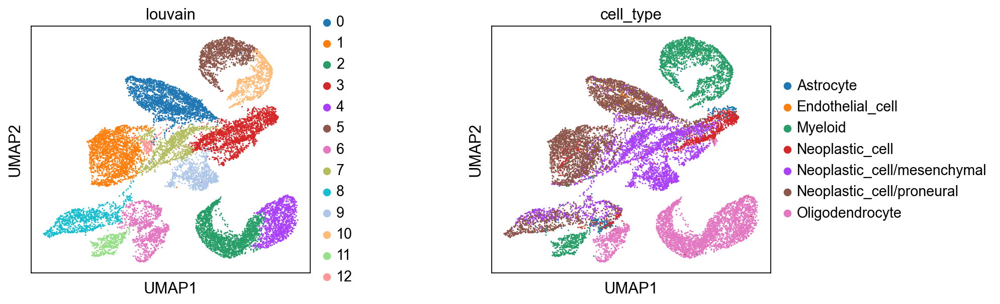

In [19]:
sc.pl.umap(adata_ref_combined, color=['louvain', 'cell_type'], wspace=0.5)


In [208]:
var_names = adata_ref_combined.var_names.intersection(adata_total_combined.var_names)
adata_ref = adata_ref_combined[:, var_names]
adata_total = df[:, var_names]

In [209]:
adata_total.obs

,cell_type,batch,louvain,sample_type,clusters,cell_type_2,cell_type_3,size,louvain_3,clusters2,cell_type_4
AAACCCAAGACATCCT-1-1914_human-1914-new,NaN,new,13,1914_human-1914,0,Endothelial,Proneural,10,13,13,Endothelial-like
AAACCCAAGCATGAAT-1-1914_human-1914-new,NaN,new,13,1914_human-1914,0,Endothelial,Proneural,10,13,13,Endothelial-like
AAACCCAAGCTAGATA-1-1914_human-1914-new,NaN,new,13,1914_human-1914,0,Endothelial,Proneural,10,13,13,Endothelial-like
AAACCCAAGTCCTGCG-1-1914_human-1914-new,NaN,new,13,1914_human-1914,0,Endothelial,Proneural,10,13,13,Endothelial-like
AAACCCACAAAGGAGA-1-1914_human-1914-new,NaN,new,11,1914_human-1914,7,Stem Cells (Mesenchymal),Mesenchymal/Proneural Mix (80/20),10,11,11,Mesenchymal/Proneural Mix (80/20)
...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCATCCTTGC-1-1919d_rat-1919-new,NaN,new,Rat Endothelial,1919d_rat-1919,35,Endothelial,Rat Endothelial,10,1,Rat Endothelial,Rat Endothelial
TTTGTTGGTGTAGTGG-1-1919d_rat-1919-new,NaN,new,Rat Endothelial,1919d_rat-1919,16,Endothelial,Rat Endothelial,10,0,Rat Endothelial,Rat Endothelial
TTTGTTGTCCATACTT-1-1919d_rat-1919-new,NaN,new,Rat Endothelial,1919d_rat-1919,18,Endothelial,Rat Endothelial,10,1,Rat Endothelial,Rat Endothelial
TTTGTTGTCCCAAGCG-1-1919d_rat-1919-new,NaN,new,Rat Endothelial,1919d_rat-1919,24,Endothelial,Rat Endothelial,10,25,Rat Endothelial,Rat Endothelial


In [179]:
adata_total.obs['clusters'] = adata_total.obs['louvain']
adata_total.obs


/var/folders/tg/d35b8qxd2dsb9362y56zzdg80000gn/T/ipykernel_15045/944180656.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_total.obs['clusters'] = adata_total.obs['louvain']


,cell_type,batch,louvain,sample_type,clusters,cell_type_2,cell_type_3,size,louvain_3,clusters2,cell_type_4
AAACCCAAGACATCCT-1-1914_human-1914-new,NaN,new,13,1914_human-1914,13,Endothelial,Proneural,10,13,13,Endothelial-like
AAACCCAAGCATGAAT-1-1914_human-1914-new,NaN,new,13,1914_human-1914,13,Endothelial,Proneural,10,13,13,Endothelial-like
AAACCCAAGCTAGATA-1-1914_human-1914-new,NaN,new,13,1914_human-1914,13,Endothelial,Proneural,10,13,13,Endothelial-like
AAACCCAAGTCCTGCG-1-1914_human-1914-new,NaN,new,13,1914_human-1914,13,Endothelial,Proneural,10,13,13,Endothelial-like
AAACCCACAAAGGAGA-1-1914_human-1914-new,NaN,new,11,1914_human-1914,11,Stem Cells (Mesenchymal),Mesenchymal/Proneural Mix (80/20),10,11,11,Mesenchymal/Proneural Mix (80/20)
...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCATCCTTGC-1-1919d_rat-1919-new,NaN,new,Rat Endothelial,1919d_rat-1919,Rat Endothelial,Endothelial,Rat Endothelial,10,1,Rat Endothelial,Rat Endothelial
TTTGTTGGTGTAGTGG-1-1919d_rat-1919-new,NaN,new,Rat Endothelial,1919d_rat-1919,Rat Endothelial,Endothelial,Rat Endothelial,10,0,Rat Endothelial,Rat Endothelial
TTTGTTGTCCATACTT-1-1919d_rat-1919-new,NaN,new,Rat Endothelial,1919d_rat-1919,Rat Endothelial,Endothelial,Rat Endothelial,10,1,Rat Endothelial,Rat Endothelial
TTTGTTGTCCCAAGCG-1-1919d_rat-1919-new,NaN,new,Rat Endothelial,1919d_rat-1919,Rat Endothelial,Endothelial,Rat Endothelial,10,25,Rat Endothelial,Rat Endothelial


In [210]:
adata_ref.obs

,cell_type,batch,louvain
AAACCCAAGAAGGTAG-1-SF10022,Neoplastic_cell/proneural,SF10022,1
AAACCCAAGACCTCCG-1-SF10022,Neoplastic_cell/proneural,SF10022,1
AAACCCACAACTTGGT-1-SF10022,Neoplastic_cell/proneural,SF10022,1
AAACCCAGTCTACGAT-1-SF10022,Oligodendrocyte,SF10022,2
AAACCCAGTTATCTTC-1-SF10022,Neoplastic_cell/mesenchymal,SF10022,1
...,...,...,...
TTTCCTCTCCCTTGGT-1-SF9259S,Oligodendrocyte,SF9259S,2
TTTGGAGTCAACACCA-1-SF9259S,Oligodendrocyte,SF9259S,2
TTTGGTTGTCGTTATG-1-SF9259S,Oligodendrocyte,SF9259S,2
TTTGTTGAGCTCTTCC-1-SF9259S,Oligodendrocyte,SF9259S,2


In [211]:
sc.tl.ingest(adata_total, adata_ref, obs='louvain')


running ingest
    finished (0:02:03)


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


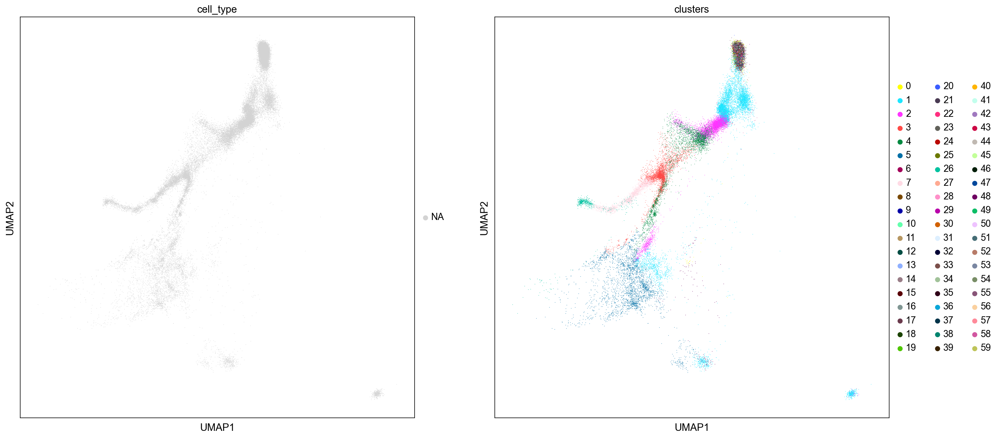

In [212]:
# adata_combined.uns['louvain_colors'] = adata_ref.uns['louvain_colors']  # fix colors
sc.pl.umap(adata_total, color=['cell_type', 'clusters'])


In [213]:
# make new category obs based on index name after -1-
adata_total.obs['sample_type'] = adata_total.obs.index.str.split('-1-').str[1]


In [ ]:
# !pip3 install bbknn

In [214]:
adata_concat.obs

,cell_type,batch,louvain,sample_type,clusters,cell_type_2,cell_type_3,size,louvain_3,clusters2,cell_type_4
AAACCCAAGAAGGTAG-1-SF10022-ref,Neoplastic_cell/proneural,ref,1,NaN,NaN,NaN,NaN,5,NaN,NaN,NaN
AAACCCAAGACCTCCG-1-SF10022-ref,Neoplastic_cell/proneural,ref,1,NaN,NaN,NaN,NaN,5,NaN,NaN,NaN
AAACCCACAACTTGGT-1-SF10022-ref,Neoplastic_cell/proneural,ref,1,NaN,NaN,NaN,NaN,5,NaN,NaN,NaN
AAACCCAGTCTACGAT-1-SF10022-ref,Oligodendrocyte,ref,2,NaN,NaN,NaN,NaN,5,NaN,NaN,NaN
AAACCCAGTTATCTTC-1-SF10022-ref,Neoplastic_cell/mesenchymal,ref,1,NaN,NaN,NaN,NaN,5,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCATCCTTGC-1-1919d_rat-1919-new-new,NaN,new,0,1919d_rat-1919-new,35,Endothelial,Rat Endothelial,10,1,Rat Endothelial,Rat Endothelial
TTTGTTGGTGTAGTGG-1-1919d_rat-1919-new-new,NaN,new,0,1919d_rat-1919-new,16,Endothelial,Rat Endothelial,10,0,Rat Endothelial,Rat Endothelial
TTTGTTGTCCATACTT-1-1919d_rat-1919-new-new,NaN,new,0,1919d_rat-1919-new,18,Endothelial,Rat Endothelial,10,1,Rat Endothelial,Rat Endothelial
TTTGTTGTCCCAAGCG-1-1919d_rat-1919-new-new,NaN,new,0,1919d_rat-1919-new,24,Endothelial,Rat Endothelial,10,25,Rat Endothelial,Rat Endothelial


In [215]:
adata_concat = adata_ref.concatenate(adata_total, batch_categories=['ref', 'new'])


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [ ]:
# sc.external.pp.bbknn(adata_concat, batch_key='batch')

In [193]:
adata_concat.obs.louvain = adata_concat.obs.louvain.astype('category')
adata_concat.obs.louvain.cat.reorder_categories(adata_ref.obs.louvain.cat.categories, inplace=True)  # fix category ordering
adata_concat.uns['louvain_colors'] = adata_ref.uns['louvain_colors']  # fix category colors


/var/folders/tg/d35b8qxd2dsb9362y56zzdg80000gn/T/ipykernel_15045/1178553373.py:2: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata_concat.obs.louvain.cat.reorder_categories(adata_ref.obs.louvain.cat.categories, inplace=True)  # fix category ordering


KeyError: 'louvain_colors'

In [35]:
# Remove rat cells where there the the word rat in sample type from the adata_concat
adata_concat_2 = adata_concat[adata_concat.obs['sample_type'].str.contains('rat') == False]

/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


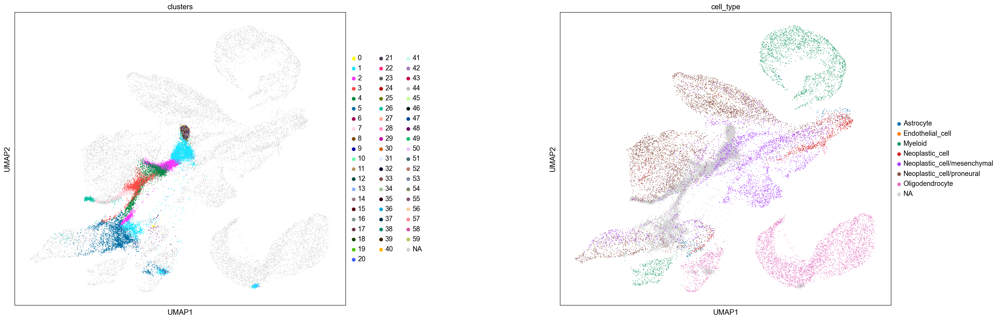

In [216]:
# provide space between the graphs:

# make the image bigger
sc.set_figure_params(dpi=80, facecolor='white', figsize=(10, 10))

# color only up to cluster 16 in column 'clusters'


# set size column that everything that has cell_type is 10 and everything else is 1
adata_concat.obs['size'] = 6

sc.pl.umap(adata_concat, color=['clusters', 'cell_type'], wspace=0.5, size=adata_concat.obs['size'])
# only show from batch new
# adata_new = adata_concat[adata_concat.obs['batch'] == 'new']
# sc.pl.umap(adata_new, color=['leiden'] , wspace=0.5)



/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


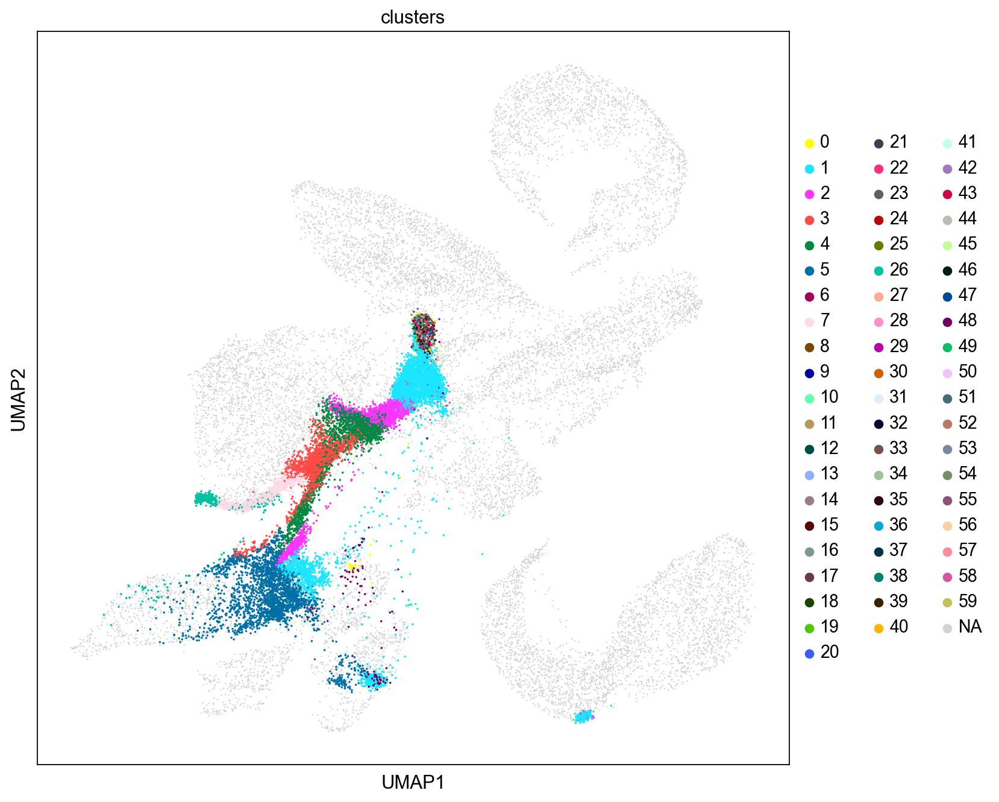

In [199]:
# make the dots of of everything with 'cell_type' category that is not NA bigger
adata_concat.obs['size'] = 10
adata_concat.obs.loc[adata_concat.obs['cell_type'].notna(), 'size'] = 5

sc.pl.umap(adata_concat, color=['clusters'], wspace=0.5, size=adata_concat.obs['size'])



In [ ]:
adata_concat.obs

In [ ]:
# count the number of cells in each cluster
adata_concat.obs['clusters'].value_counts()

# how many have above  

In [ ]:
# renormalize and log and neighbours umap adata_new


adata_new = adata_concat[adata_concat.obs['batch'] == 'new']

sc.tl.pca(adata_new, svd_solver='arpack')
sc.pp.neighbors(adata_new, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_new)
sc.tl.leiden(adata_new, resolution=0.5)


In [ ]:

# call all na values in cell_type_3 'rat_endothelial'
adata_new.obs['cell_type_3'] = adata_new.obs['cell_type_3'].fillna('rat_endothelial')



In [ ]:
adata_new_2 = adata_new[adata_new.obs['sample_type'].str.contains('rat') == False]

sc.tl.pca(adata_new_2, svd_solver='arpack')
sc.pp.neighbors(adata_new_2, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_new_2)
sc.tl.leiden(adata_new_2, resolution=0.5)


In [ ]:
sc.pl.umap(adata_new_2, color="cell_type_3")


In [ ]:
# for each louvain cluster, plot the cell type distribution
for i in adata_concat.obs.louvain.cat.categories:
    print(i)
    try:
        sc.pl.umap(adata_concat[adata_concat.obs.louvain == i], color=['clusters'])
        
    except:
        pass
    


In [31]:
# cell_type_2 is based on louvain: cluster 0 = endothelial, cluster 1 = Stem Cells (Mesenchymal), Cluster 2 = Oligodendyrocye-like, Cluster 6 = Astrocyte-like, Cluster 7 = Stem Cells (Mesenchymal, Proneural Mix), Cluster 8 = Stem Cells (Mesenchymal, Proneural Mix)
# for all louvain cluster 0, set cell_type_2 to be Endothelial
adata_concat.obs.loc[adata_concat.obs.louvain == '0', 'cell_type_2'] = 'Endothelial'

# for all louvain cluster 1, set cell_type_2 to be Stem Cells (Mesenchymal)
adata_concat.obs.loc[adata_concat.obs.louvain == '1', 'cell_type_2'] = 'Stem Cells (Mesenchymal)'

# for all louvain cluster 2, set cell_type_2 to be Oligodendyrocye-like
adata_concat.obs.loc[adata_concat.obs.louvain == '2', 'cell_type_2'] = 'Oligodendyrocye-like'

# for all louvain cluster 6, set cell_type_2 to be Astrocyte-like
adata_concat.obs.loc[adata_concat.obs.louvain == '6', 'cell_type_2'] = 'Astrocyte-like'

# for all louvain cluster 7, set cell_type_2 to be Stem Cells (Mesenchymal, Proneural Mix)
adata_concat.obs.loc[adata_concat.obs.louvain == '7', 'cell_type_2'] = 'Stem Cells (Mesenchymal, Proneural Mix)'

# for all louvain cluster 8, set cell_type_2 to be Stem Cells (Mesenchymal, Proneural Mix)
adata_concat.obs.loc[adata_concat.obs.louvain == '8', 'cell_type_2'] = 'Stem Cells (Mesenchymal, Proneural Mix)'


In [33]:
# cell_type_2 is based on louvain: cluster 0 = endothelial, cluster 1 = Stem Cells (Mesenchymal), Cluster 2 = Oligodendyrocye-like, Cluster 6 = Astrocyte-like, Cluster 7 = Stem Cells (Mesenchymal, Proneural Mix), Cluster 8 = Stem Cells (Mesenchymal, Proneural Mix)
# for all louvain cluster 0, set cell_type_2 to be Endothelial
# drop cell_type_3
# adata_concat.obs.drop(columns=['cell_type_3'], inplace=True)
adata_concat.obs.loc[adata_concat.obs.clusters == '2', 'cell_type_3'] = 'Maturing Mesenchymal'
adata_concat.obs.loc[adata_concat.obs.clusters == '3', 'cell_type_3'] = 'Mesenchymal/Proneural Mix (70/30)'
adata_concat.obs.loc[adata_concat.obs.clusters == '4', 'cell_type_3'] = 'Mesenchymal'
adata_concat.obs.loc[adata_concat.obs.clusters == '7', 'cell_type_3'] = 'Mesenchymal/Proneural Mix (80/20)'
adata_concat.obs.loc[adata_concat.obs.clusters == '26', 'cell_type_3'] = 'Stem Cells/Mesenchymal/Pron Mix'
adata_concat.obs.loc[adata_concat.obs.clusters == '1', 'cell_type_3'] = 'Oligodendorcyte'
adata_concat.obs.loc[adata_concat.obs.clusters == '0', 'cell_type_3'] = 'Proneural'
adata_concat.obs.loc[adata_concat.obs.clusters == '48', 'cell_type_3'] = 'Proneural'
adata_concat.obs.loc[adata_concat.obs.clusters == '5', 'cell_type_3'] = 'Astrocyte-like'

# for everything that is not na, but does have a cell type in cell_type, set cell_type_3 to be the same as cell_type
# for everything that does not have a cell type in cell_type, and does not have a cell_type_3 set to be rat_endothelial
adata_concat.obs.loc[adata_concat.obs.cell_type_3.isna() & adata_concat.obs.cell_type.isna(), 'cell_type_3'] = 'Rat Endothelial'

# adata_concat.obs.loc[adata_concat.obs.cell_type_3.isna() & adata_concat.obs.cell_type.notna(), 'cell_type_3'] = adata_concat.obs.cell_type


In [ ]:
adata_concat.obs

In [ ]:
sc.tl.paga(adata_total, groups='clusters')
sc.pl.paga(adata_total, color=['clusters'])

In [ ]:
# save cell_type count and plot as histogram

# adata_concat.obs.cell_type_3.value_counts().plot(kind='bar')

# remove rat endothelial and make each value as a fraction of the whole
# adata_concat.obs.cell_type_3.value_counts().drop('Rat Endothelial').plot(kind='bar')

# do each cell type as a percentage
# adata_concat.obs.cell_type_3.value_counts().drop('Rat Endothelial').apply(lambda x: x/adata_concat.obs.cell_type_3.value_counts().drop('Rat Endothelial').sum()).plot(kind='bar')

# as a pie chart with percentages overlaid
adata_concat.obs.cell_type_3.value_counts().drop('Rat Endothelial').apply(lambda x: x/adata_concat.obs.cell_type_3.value_counts().drop('Rat Endothelial').sum()).plot(kind='pie', autopct='%1.1f%%')


In [ ]:
import matplotlib.pyplot as plt
#add percentages to pie chart with bolded text
adata_concat.obs.cell_type.value_counts().apply(lambda x: x/adata_concat.obs.cell_type.value_counts().sum()).plot(kind='pie', autopct='%1.1f%%', textprops={'fontsize': 22})
#  and bold the text




In [ ]:
sc.tl.draw_graph(adata_total, init_pos='paga')

In [ ]:
sc.pl.draw_graph(adata_total, color=['clusters','cell_type_3'], legend_loc='on data', layout='fr')


In [ ]:
adata_total.uns['iroot'] = np.flatnonzero(adata.obs['clusters']  == '48')[0]
sc.tl.dpt(adata_total)
sc.pl.draw_graph(adata_total, color=['dpt_pseudotime'])



In [ ]:

# normalize data
sc.pp.normalize_total(adata_ref_combined, target_sum=1e4)
sc.pp.log1p(adata_ref_combined)

In [ ]:
import time
t_start = time.time()
model_fs = celltypist.train(adata_ref_combined, 'cell_type', n_jobs = 10, max_iter = 5, use_SGD = True)
t_end = time.time()
print(f"Time elapsed: {t_end - t_start} seconds")


In [ ]:
model_fs.write('write/model_fs.pkl')

In [ ]:
gene_index = np.argpartition(np.abs(model_fs.classifier.coef_), -1000, axis = 1)[:, -1000:]
gene_index = np.unique(gene_index)
print(f"Number of genes selected: {len(gene_index)}")

In [ ]:
t_start = time.time()
model = celltypist.train(adata_ref_combined[:,gene_index], 'cell_type', check_expression = False, n_jobs = 10, max_iter = 100, balance_cell_type=True, use_SGD = True)
t_end = time.time()
print(f"Time elapsed: {t_end - t_start} seconds")

In [ ]:
model.write('models/snseq_glio.pkl')
adata_total =sc.read_h5ad('write/total_combined.h5ad')

In [ ]:
sc.pp.normalize_per_cell(adata_total)
sc.pp.log1p(adata_total)
model = 'models/snseq_glio.pkl'

In [ ]:
predictions = celltypist.annotate(adata_total[:,gene_index], model, majority_voting=True)

In [ ]:
predictions.predicted_labels
adata_predict = predictions.to_adata()  

In [ ]:
sc.pp.neighbors(adata_predict)
sc.tl.umap(adata_predict)

In [ ]:
sc.pl.umap(adata_predict, color=['predicted_labels'], wspace = 0.5)

In [ ]:
# Group the files in the directory /Volumes/Extreme_SSD/snRNA  that contain the same prefix, before matrix/features/barcodes into folders using the array below:

import os 
import shutil

# create a list of all the files in the directory
files = os.listdir('/Volumes/Extreme_SSD/snRNA/')

# create a list of all the prefixes, which end after the third underscore
prefixes = [file.split('_')[0:3] for file in files]

# group the files by prefix
prefixes = [prefix[0] + '_' + prefix[1] + '_' + prefix[2] for prefix in prefixes]

# remove everything without a . in front of it
prefixes = [prefix for prefix in prefixes if prefix[0] == '.']

# // remove first two characters
prefixes = [prefix[2:] for prefix in prefixes]

prefixes

# remove all files that have ._ in front of them in files array
files = [file for file in files if file[0:2] != '._']

# deduplicate files array
files = list(set(files))

for prefix in prefixes:
    try:
        os.makedirs('/Volumes/Extreme_SSD/snRNA/' + prefix)
    except:
        print('folder already exists')
    for file in files:
        if prefix in file:
            try:
                shutil.move('/Volumes/Extreme_SSD/snRNA/' + file, '/Volumes/Extreme_SSD/snRNA/' + prefix + '/' + file)
            except:
                print('file already moved')




In [200]:
df = sc.read_h5ad('write/just_ours.h5ad')


In [201]:
df.obs

,cell_type,batch,louvain,sample_type,clusters,cell_type_2,cell_type_3,size,louvain_3,clusters2,cell_type_4
AAACCCAAGACATCCT-1-1914_human-1914-new,NaN,new,13,1914_human-1914,0,Endothelial,Proneural,10,13,13,Endothelial-like
AAACCCAAGCATGAAT-1-1914_human-1914-new,NaN,new,13,1914_human-1914,0,Endothelial,Proneural,10,13,13,Endothelial-like
AAACCCAAGCTAGATA-1-1914_human-1914-new,NaN,new,13,1914_human-1914,0,Endothelial,Proneural,10,13,13,Endothelial-like
AAACCCAAGTCCTGCG-1-1914_human-1914-new,NaN,new,13,1914_human-1914,0,Endothelial,Proneural,10,13,13,Endothelial-like
AAACCCACAAAGGAGA-1-1914_human-1914-new,NaN,new,11,1914_human-1914,7,Stem Cells (Mesenchymal),Mesenchymal/Proneural Mix (80/20),10,11,11,Mesenchymal/Proneural Mix (80/20)
...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCATCCTTGC-1-1919d_rat-1919-new,NaN,new,Rat Endothelial,1919d_rat-1919,35,Endothelial,Rat Endothelial,10,1,Rat Endothelial,Rat Endothelial
TTTGTTGGTGTAGTGG-1-1919d_rat-1919-new,NaN,new,Rat Endothelial,1919d_rat-1919,16,Endothelial,Rat Endothelial,10,0,Rat Endothelial,Rat Endothelial
TTTGTTGTCCATACTT-1-1919d_rat-1919-new,NaN,new,Rat Endothelial,1919d_rat-1919,18,Endothelial,Rat Endothelial,10,1,Rat Endothelial,Rat Endothelial
TTTGTTGTCCCAAGCG-1-1919d_rat-1919-new,NaN,new,Rat Endothelial,1919d_rat-1919,24,Endothelial,Rat Endothelial,10,25,Rat Endothelial,Rat Endothelial


In [202]:
# make a df of only stuff with cell_type_3
df = df[df.obs.cell_type_3.notna()]

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:59)


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


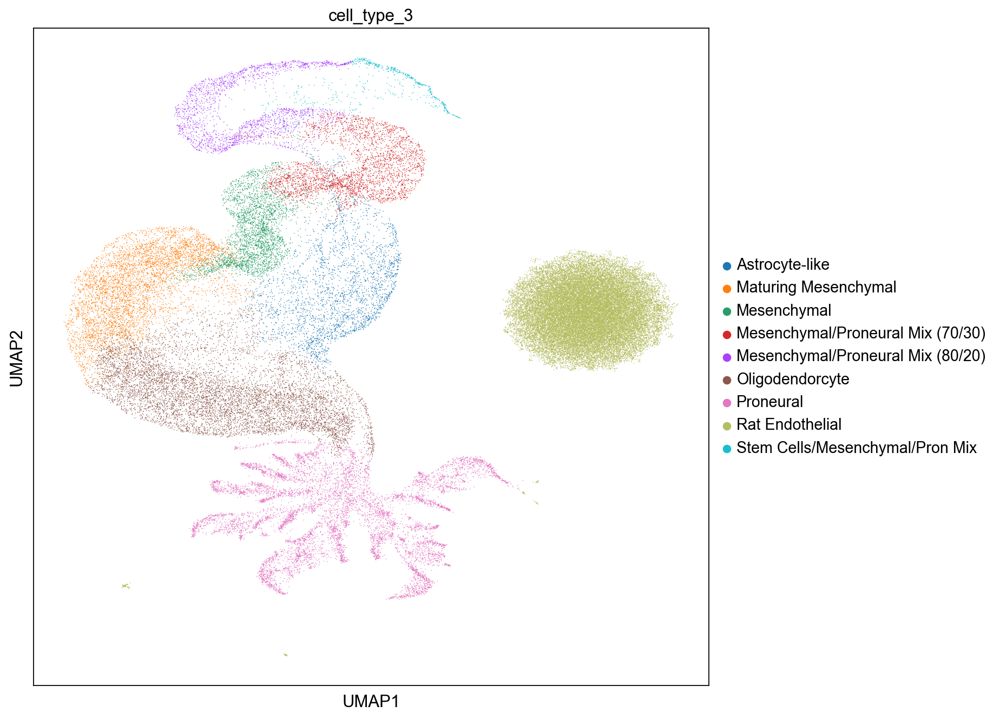

In [203]:
# do umap
sc.pp.neighbors(df)
sc.tl.umap(df)

# plot umap
sc.pl.umap(df, color=['cell_type_3'], wspace = 0.5)



In [204]:
# do louvain clustering
sc.tl.louvain(df, resolution=1.0)


running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 49 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:10)


In [205]:
# make a new column from louvain, when the cell_type_3 is not 'Rat Endothelial' and 'Rat Endothelial' otherwise
df.obs['louvain'] = np.where(df.obs.cell_type_3 != 'Rat Endothelial', df.obs.louvain, 'Rat Endothelial')

In [ ]:
# make a new column called cell_type_4 which is cell_type_3, except when the cells match louvain cluster 13, then it is "Endothelial-like"
df.obs['cell_type_4'] = np.where(df.obs.louvain == '14', 'Proneural', df.obs.cell_type_4)

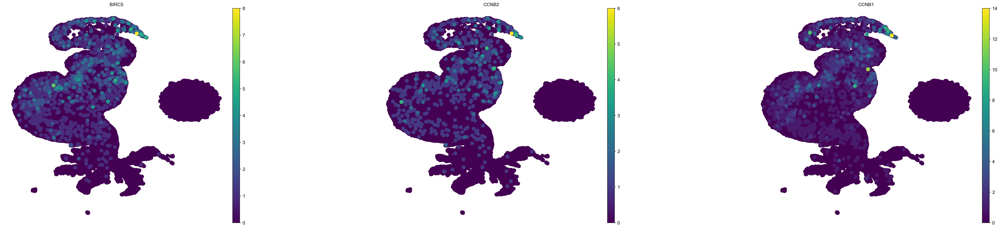

KeyError: 'X_pca'

<Figure size 3600x800 with 0 Axes>

In [242]:
# make the chart bigger
import matplotlib as plt
plt.rcParams['figure.figsize'] = [10, 10]
# increase the size of the dots that are highly colored
# make into a single graph
sc.pl.umap(df, color=['BIRC5', 'CCNB2', 'CCNB1'],  wspace = 0.5, size=400, color_map='viridis')
# layer all three colors on top of eacher other
# 


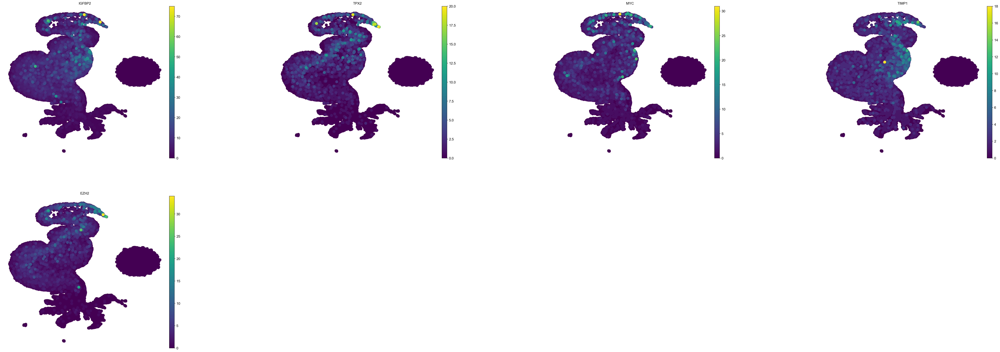

In [244]:
sc.pl.umap(df, color=['IGFBP2', 'TPX2', 'MYC', 'TIMP1', 'EZH2'],  wspace = 0.5, size=400, color_map='viridis')


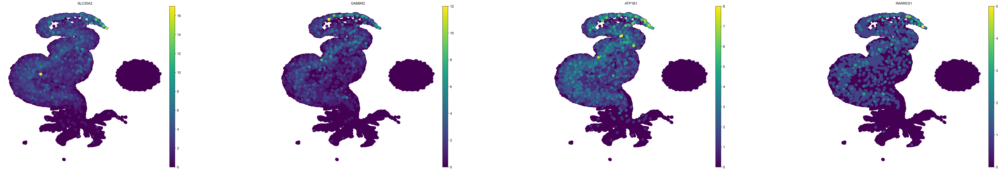

In [247]:
sc.pl.umap(df, color=['SLC20A2', 'GABBR2', 'ATP1B1', "RARRES1"],  wspace = 0.5, size=400, color_map='viridis')


In [207]:
# save the df
df.write('write/just_ours.h5ad')

In [220]:
# do paga
sc.tl.paga(df, groups='cell_type_4')


running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:01)


--> added 'pos', the PAGA positions (adata.uns['paga'])


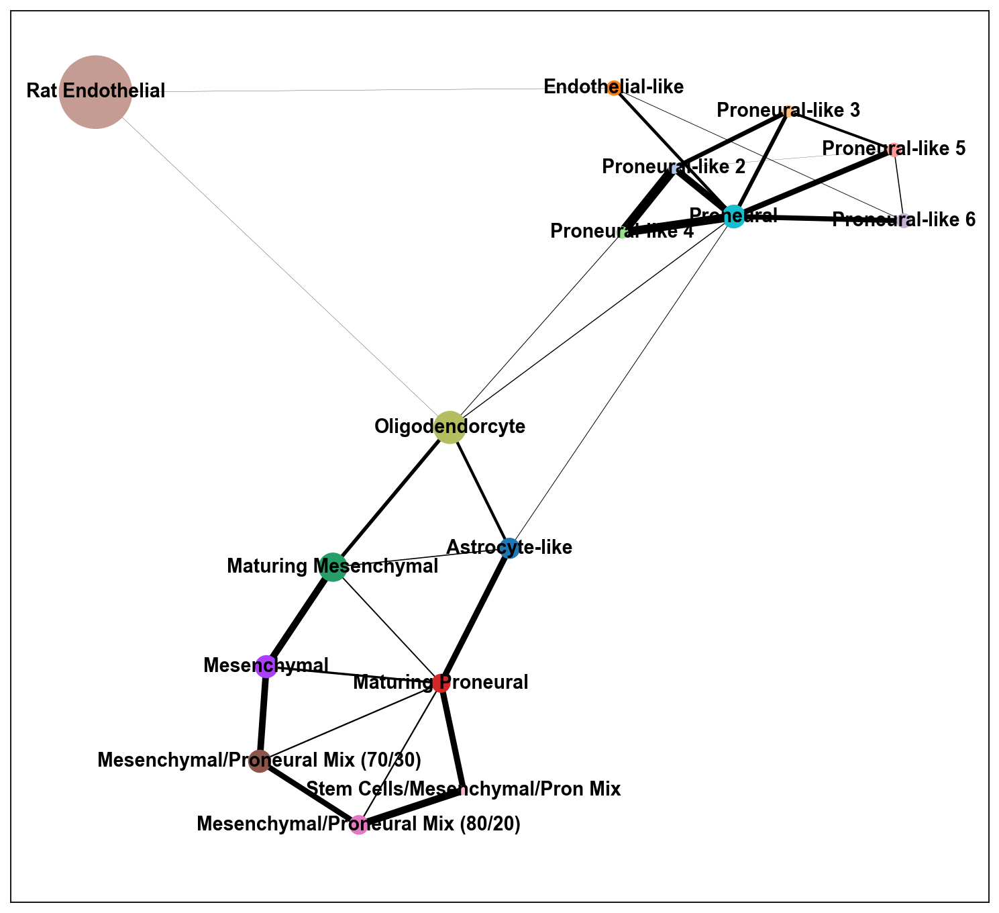

In [221]:
# plot paga
sc.pl.paga(df, color=['cell_type_4'], node_size_scale=1, node_size_power=1, layout='fr')

In [224]:

# do umap starting with paga
sc.tl.draw_graph(df, layout='lgl', init_pos='umap')


drawing single-cell graph using layout 'lgl'


KeyboardInterrupt: 

In [ ]:

# plot umap
sc.pl.draw_graph(df, color=['cell_type_4'], legend_loc='on data', layout='fr')

In [7]:
# find the genes that are highly expressed in each cluster of cell_type_3
df.obs.groupby(['cell_type_3', 'clusters']).size()

# find the genes that are highly expressed in each cluster of cell_type_3
df.obs.groupby(['cell_type_3', 'clusters']).size()



cell_type_3                      clusters
Astrocyte-like                   0           0
                                 1           0
                                 2           0
                                 3           0
                                 4           0
                                            ..
Stem Cells/Mesenchymal/Pron Mix  55          0
                                 56          0
                                 57          0
                                 58          0
                                 59          0
Length: 540, dtype: int64

In [63]:
# log and normalize the data
sc.pp.normalize_total(df, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:197: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


In [90]:
sc.tl.rank_genes_groups(df, 'cell_type_4', method='t-test')
# save results to csv
df.uns['rank_genes_groups']['names']


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:417: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:417: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:417: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:417: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:417: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func

rec.array([('MT-CO3', 'RPLP1', 'MALAT1', 'MT-CO3', 'MALAT1', 'MALAT1', 'MALAT1', 'FTX', 'MT-CO3', 'MALAT1', 'MALAT1', 'MALAT1', 'RPLP1', 'RPS2', 'ST7', 'MALAT1'),
           ('MT-ND4', 'GAPDH', 'XIST', 'MT-CO2', 'XIST', 'XIST', 'WSB1', 'NOVA1', 'RPS2', 'RPLP1', 'RPS2', 'RPLP1', 'RPS2', 'RPLP1', 'F5', 'XIST'),
           ('MT-ND3', 'RPS2', 'FTX', 'MT-ND4', 'FTX', 'WSB1', 'XIST', 'GREB1L', 'RPLP1', 'RPS2', 'RPLP1', 'RPS2', 'VIM', 'VIM', 'F8', 'PVT1'),
           ...,
           ('ZFY', 'SCMH1', 'MT-CO2', 'ST7', 'RPLP1', 'MT-ATP6', 'RPS18', 'MT-ND2', 'LRP4-AS1', 'JAKMIP2', 'TCF7L1', 'BCL2L14', 'RHBDL3', 'INVS', 'FTX', 'RPS4X'),
           ('KCNMA1-AS3', 'SATB2', 'MT-CO3', 'ZFY', 'MT-CO3', 'RPS2', 'RPS2', 'MT-ND1', 'SNX32', 'DLG1', 'RHBDL3', 'TEAD1', 'AFF3', 'RAPH1', 'GREB1L', 'RPL39'),
           ('MALAT1', 'MALAT1', 'MT-ATP6', 'SNHG25', 'MT-ATP6', 'RPLP1', 'RPLP1', 'MT-CO1', 'SPDYE2', 'TBC1D22A', 'SPIDR', 'RHBDL3', 'JAKMIP2', 'MT-CO3', 'MALAT1', 'RPLP1')],
          dtype=[('Astrocyte-li

In [109]:
result = df.uns['rank_genes_groups']
# write to csv output



In [110]:
# with index being names and data being scores
result = pd.DataFrame(data=result['scores'])

In [106]:
result

,Astrocyte-like,Endothelial-like,Maturing Mesenchymal,Maturing Proneural,Mesenchymal,Mesenchymal/Proneural Mix (70/30),Mesenchymal/Proneural Mix (80/20),Oligodendorcyte,Proneural,Proneural-like 2,Proneural-like 3,Proneural-like 4,Proneural-like 5,Proneural-like 6,Rat Endothelial,Stem Cells/Mesenchymal/Pron Mix
0,MT-CO3,RPLP1,MALAT1,MT-CO3,MALAT1,MALAT1,MALAT1,FTX,MT-CO3,MALAT1,MALAT1,MALAT1,RPLP1,RPS2,ST7,MALAT1
1,MT-ND4,GAPDH,XIST,MT-CO2,XIST,XIST,WSB1,NOVA1,RPS2,RPLP1,RPS2,RPLP1,RPS2,RPLP1,F5,XIST
2,MT-ND3,RPS2,FTX,MT-ND4,FTX,WSB1,XIST,GREB1L,RPLP1,RPS2,RPLP1,RPS2,VIM,VIM,F8,PVT1
3,MT-CO2,VIM,MSI2,MT-CYB,NOVA1,FTX,PVT1,TENM3,RPS18,VIM,VIM,VIM,GAPDH,RPS18,FAM120C,WSB1
4,MT-ATP6,RPS18,GPC6,MT-ND2,TCF12,FNDC3B,NEAT1,MSI2,GAPDH,GAPDH,RPS18,GAPDH,RPS18,RPS4X,PCOLCE2,WRN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20479,ST7,PAN3,MT-ND4,TMSB4X,MT-CO2,GAPDH,MT-ATP6,MT-CO2,DCAF15,PLEKHG1,KDM3B,SPDYE2,PRKD1,RHBDL3,XIST,RPL10
20480,SMAD1-AS1,MAML3,MT-CO1,SLC26A3,RPS2,RPS18,MT-CO3,MT-ATP6,ODF2L,RHBDL3,C4orf47,PBX1,PLEKHG1,STAG1,NOVA1,RPL41
20481,ZFY,SCMH1,MT-CO2,ST7,RPLP1,MT-ATP6,RPS18,MT-ND2,LRP4-AS1,JAKMIP2,TCF7L1,BCL2L14,RHBDL3,INVS,FTX,RPS4X
20482,KCNMA1-AS3,SATB2,MT-CO3,ZFY,MT-CO3,RPS2,RPS2,MT-ND1,SNX32,DLG1,RHBDL3,TEAD1,AFF3,RAPH1,GREB1L,RPL39


In [112]:

# save the dataframe to a CSV file
result.to_csv('scores.csv', index=False)

In [78]:

# turn df2 into csv form
df2 = df.uns['rank_genes_groups']
df2

np.savetxt('genes.csv', df2, delimiter=',', fmt='%s')



ValueError: Expected 1D or 2D array, got 0D array instead

In [72]:
# write dict to csv




AttributeError: 'dict' object has no attribute 'write'

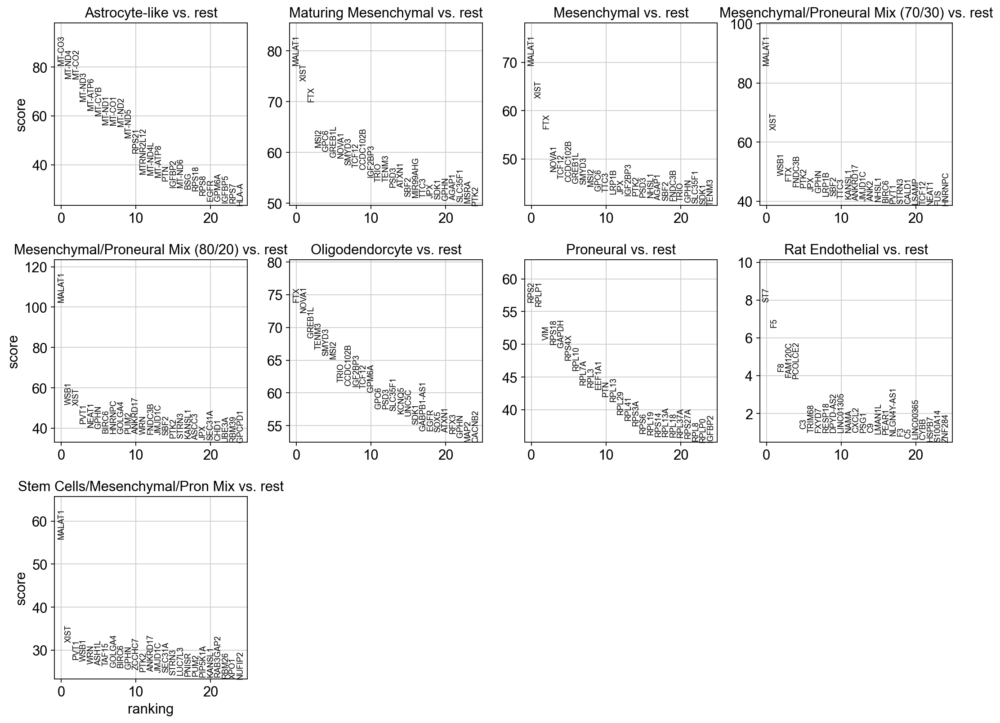

In [17]:
sc.pl.rank_genes_groups(df, n_genes=25, sharey=False)
